In [105]:
!pip install PyMuPDF pandas nltk

Importar librerias requeridas

In [106]:
import fitz
import pandas as pd
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 1. Extraer texto del guión

Función para extraer texto de PDF

In [107]:
def get_text_from_pdf(filename):
    document = fitz.open(filename)
    pages = []

    for page in document:
        text = page.get_text()
        pages.append(text.strip())

    document.close()
    return pages

In [108]:
# Nombre del archivo a leer
filename = 'Los_Californios_Dedicatoria_Palabras_del_Autor_Prologo.pdf'

# Extraer texto de pdf
pages = get_text_from_pdf(filename)
df = pd.DataFrame(pages, columns=['Texto'])

print(df)

                                                 Texto
0    Los Californios \nLa gesta heroica de los vasc...
1    Fabiola, Luis Alejandro, Adrián Esteban y Jorg...
2    Es la primera vez que una serie sobre este tem...
3    Prólogo \nLos Peralta somos una familia con ra...
4    Capítulo 1 \nLa memoria en movimiento \n \nCas...
..                                                 ...
128  Pero la pausa fue breve. Pocos días después, d...
129  La epopeya había culminado. Pero la verdadera ...
130  Narrado por Zoey \n“California era de los Cali...
131  —Aspiren... —dijo, sonriendo con devoción—. La...
132                                                   

[133 rows x 1 columns]


# 2. Clasificación por capítulo

In [109]:
# Concatenar el texto de todas las páginas
book = "\n".join(pages)

# Hacer split por capitulo
chapter_pattern = r'(?i)(capítulo \d+|cap\.\s*\d+)'  # Case insensitive
chapters = re.split(chapter_pattern, book)

chapter_dict = {}
for i in range(1, len(chapters), 2):
    chapter_title = chapters[i].strip()
    chapter_content = chapters[i + 1].strip()
    chapter_dict[chapter_title] = chapter_content

df_chapters = pd.DataFrame(list(chapter_dict.items()), columns=['Capítulo', 'Contenido'])

print(df_chapters)

       Capítulo                                          Contenido
0    Capítulo 1  La memoria en movimiento \n \nCasa familia Per...
1    Capítulo 2  : Una persona inolvidable\nMarket Street San F...
2    Capítulo 3  : Ecos de un legado \nSan Francisco, 1876. La ...
3    Capítulo 4  : Amenaza entre sombras \nTras el almuerzo, lo...
4    Capítulo 5  : El legado hispano \n \n                     ...
5    Capítulo 6  : El amor a los caballos \nEl estadio al aire ...
6    Capítulo 7  : Bajo la Luna de San Francisco \nLa luna llen...
7    Capítulo 8  : El legado que no se puede borrar \nLa carret...
8    Capítulo 9  : Una semilla para el porvenir \nEl año era 17...
9   Capítulo 10  : Se gesta la hazaña \nTubac, Sonora. Año de 1...
10  Capítulo 11  : El Mapa del Destino \nNarrado por Zoey \nDes...
11  Capítulo 12  : Cabalgando a la Bahía de San Francisco \nNar...
12  Capítulo 13  : Compromiso bajo la sombra del mezquite \nNar...
13  Capítulo 14  : Preparativos y despedidas \nNarrado por Zoe

# 3. Hacer Limpieza de texto

In [110]:
# Limpiar el contenido de cada capítulo
def clean_text(text):
    # Elimina caracteres no alfabéticos, pero permite letras y números
    words = re.sub(r'[^a-zA-Z0-9áéíóúüñÁÉÍÓÚÜÑ]', ' ', text)
    # Elimina espacios en blanco extra
    words = re.sub(r'\s{2,}', ' ', words.strip())
    return words

df_chapters['Contenido_Limpio'] = df_chapters['Contenido'].apply(clean_text)

print(df_chapters[['Capítulo', 'Contenido_Limpio']])

       Capítulo                                   Contenido_Limpio
0    Capítulo 1  La memoria en movimiento Casa familia Peralta ...
1    Capítulo 2  Una persona inolvidable Market Street San Fran...
2    Capítulo 3  Ecos de un legado San Francisco 1876 La vida p...
3    Capítulo 4  Amenaza entre sombras Tras el almuerzo los Per...
4    Capítulo 5  El legado hispano City Hall San Francisco 1876...
5    Capítulo 6  El amor a los caballos El estadio al aire libr...
6    Capítulo 7  Bajo la Luna de San Francisco La luna llena co...
7    Capítulo 8  El legado que no se puede borrar La carreta av...
8    Capítulo 9  Una semilla para el porvenir El año era 1773 y...
9   Capítulo 10  Se gesta la hazaña Tubac Sonora Año de 1774 La...
10  Capítulo 11  El Mapa del Destino Narrado por Zoey Desde los...
11  Capítulo 12  Cabalgando a la Bahía de San Francisco Narrado...
12  Capítulo 13  Compromiso bajo la sombra del mezquite Narrado...
13  Capítulo 14  Preparativos y despedidas Narrado por Zoey La

# 4. Tokenizacion

In [111]:
# Tokenización de los textos limpios por capítulo
Xtok = [text.lower().split() for text in df_chapters['Contenido_Limpio']]

In [112]:
# Obtener el total de tokens
total_tokens = sum(len(tokens) for tokens in Xtok)
print("Total Tokens:", total_tokens)

Total Tokens: 39121


# 5. Stopwords

Las stop words son palabras que, aunque son esenciales para la construcción gramatical de las oraciones, no aportan un contenido significativo que ayude en tareas de análisis como la clasificación de texto, la extracción de información o el análisis de sentimientos

In [113]:
nltk.download('stopwords')
stop_words = set(stopwords.words('spanish'))
Xtok_filtered = [[word for word in tokens if word not in stop_words] for tokens in Xtok]

# Obtener el total de tokens
total_tokens = sum(len(tokens) for tokens in Xtok_filtered)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# 6. Vocabulario

In [114]:
vocab = []

for x in Xtok_filtered:
  vocab.extend(x)

vocab = list(set(vocab))

vocab.sort()
print('Tamaño del vocabulario:', len(vocab))

Tamaño del vocabulario: 6911


# 7 - Diccionario: Frecuencia de los tokens

In [115]:
dicc = {}   # diccionario de la forma {key:value} --> {word:freq}

for x in Xtok_filtered:     # Tomamos cada comentario ya filtrado o procesado.
  for w in x:

    if w in dicc:
      dicc[w] += 1
    else:
      dicc[w] = 1

# 8. Nube de palabras

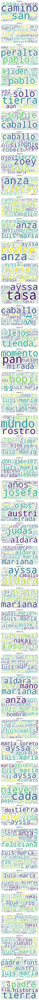

In [116]:
chapter_strings = {}

for index, row in df_chapters.iterrows():
    chapter_title = row['Capítulo']
    chapter_content = row['Contenido_Limpio']

    if chapter_title not in chapter_strings:
        chapter_strings[chapter_title] = []

    filtered_tokens = [word for word in chapter_content.lower().split() if word not in stop_words]
    chapter_strings[chapter_title].extend(filtered_tokens)

# Crear nube de palabras por capitulo
num_chapters = len(chapter_strings)
fig, axes = plt.subplots(nrows=num_chapters, figsize=(12, num_chapters * 3), squeeze=False)

for ax, (chapter_title, tokens) in zip(axes.flatten(), chapter_strings.items()):
    chapter_text = ' '.join(tokens)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(chapter_text)

    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off")
    ax.set_title(chapter_title)

plt.tight_layout()
plt.show()

# 9. Dimensionalidad

In [117]:
dimensionality = []

for index, row in df_chapters.iterrows():
    chapter_title = row['Capítulo']
    chapter_clean_content = row['Contenido_Limpio']

    tokens = chapter_clean_content.lower().split()
    filtered_tokens = [word for word in tokens if word not in stop_words]

    num_tokens = len(tokens)
    num_unique_tokens = len(set(filtered_tokens))  # Total de tokens únicos

    dimensionality.append({
        'Capítulo': chapter_title,
        'Total Tokens': num_tokens,
        'Unique Tokens': num_unique_tokens
    })

dimensionality_df = pd.DataFrame(dimensionality)
total_book_tokens = sum(dimensionality_df['Total Tokens'])
total_unique_book_tokens = sum(dimensionality_df['Unique Tokens'])

print("Dimensionalidad de cada Capítulo:")
print(dimensionality_df)

print("\nDimensionalidad Total del Libro:")
print(f"Total Tokens: {total_book_tokens}")
print(f"Unique Tokens: {total_unique_book_tokens}")

Dimensionalidad de cada Capítulo:
       Capítulo  Total Tokens  Unique Tokens
0    Capítulo 1          1100            427
1    Capítulo 2           822            372
2    Capítulo 3           674            314
3    Capítulo 4          1007            440
4    Capítulo 5          1012            443
5    Capítulo 6           999            409
6    Capítulo 7           708            272
7    Capítulo 8           945            360
8    Capítulo 9          1252            521
9   Capítulo 10          1006            462
10  Capítulo 11           501            232
11  Capítulo 12           939            403
12  Capítulo 13           792            326
13  Capítulo 14          1322            516
14  Capítulo 15           608            265
15  Capítulo 16           896            401
16  Capítulo 17           741            352
17  Capítulo 18          1442            599
18  Capítulo 19           875            366
19  Capítulo 20           763            347
20  Capítulo 21      